# Pore detection and analysis (NupX sublocalization)
### mature = NPC *vs* intermediate = PI 

This notebook should be run on 3-colour images with POM121 labeled in the Star460L channel, mAb414 in the Star580 and NupX in the Star635P channel to get the best resolution. It is supposed to be launched from the *"Launcher_for_serial_NupX_analysis.ipynb"* Jupyter Notebook. The file paths and names are recovered from the launcher.

Here is the workflow:

1. Preprocess images (outliers removed, min-max adjusted, smoothed,  out-of-focus areas removal)
>function **process.py**
2. Calculate thresholds for POM121 and mAb414 channels (Otsu method)
3. Detect POM121 and mAB414 spots with Astropy.
>function **detect.py**
4. Sort out PIs and NPCs (calculate min distance between POM121 and mAb414)
>function **mindist.py**
5. Visualize and save results
6. Measure rotationally averaged line profiles on NupX
>function **line_profile.py**
>save data
7. Iteratively fit profiles with up to 4 gaussians. Extract parameters.
>function **iterative_functions.py**
>save data
8. Plot the distributions of 
    - number of iterations that were reached
    - positions of the peaks
>function
>save data



## Table of content:
* [Import libraries](#libraries)
* [Pre-process images](#pre-processing)
* [Detect peaks](#detect)
* [Sort pore types](#sorting)
* [Analyze pore intermediates](#analysis)


2023/11/10: code OK jusqu'à la détection des pores 

---

## Import libraries <a class="anchor" id="libraries"></a>



In [3]:
import sys
!{sys.executable} -m pip install photutils

  Obtaining dependency information for photutils from https://files.pythonhosted.org/packages/91/f2/9953beb47ec508ca1a74f85a8a2d1456dcbc7c72006824edff95599a40d8/photutils-1.9.0-cp311-cp311-win_amd64.whl.metadata
   ---------------------------------------- 0.0/670.4 kB ? eta -:--:--
    --------------------------------------- 10.2/670.4 kB ? eta -:--:--
   ------ --------------------------------- 112.6/670.4 kB 1.6 MB/s eta 0:00:01
   --------------------- ------------------ 358.4/670.4 kB 3.2 MB/s eta 0:00:01
   ---------------------------------------  665.6/670.4 kB 3.8 MB/s eta 0:00:01
   ---------------------------------------- 670.4/670.4 kB 3.3 MB/s eta 0:00:00


---

## Pre-process images <a class="anchor" id="pre-processing"></a>


In [1]:
# Import packages

import tifffile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import array
import skimage.filters as skfilt
from scipy import ndimage
from skimage.filters import threshold_otsu
import photutils


from iterative_functions import lorentzian, gaussian, iterative_fit
from nucmask import nucleus_mask, nucleus_focus_mask
from process import process
from detect import detect_pores
from line_profile import generate_line_profile, generate_rotational_line_profile
from mindist import shorter_dist, closest_point

In [2]:
## Load data and paths

#dirpath = '/Users/christine/Documents/Data/STED/Data_for_analysis_NupX'
#outputpath = '/Users/christine/Documents/Data/STED/Data_for_analysis_NupX/Results/20230425_18:19'
dirpath = 'C:/Users/Emilie/Documents/Data/STED/Test_file/Tif_raw_data'
outputpath = 'C:/Users/Emilie/Documents/Data/STED/Test_file/output_data'

#mABpath = '/Users/christine/Documents/Data/STED/Data_for_analysis_NupX/220819_Nup96_2.msr_414.tif'
#POMpath = '/Users/christine/Documents/Data/STED/Data_for_analysis_NupX/220819_Nup96_2.msr_POM.tif'
#NupXpath = '/Users/christine/Documents/Data/STED/Data_for_analysis_NupX/220819_Nup96_2.msr_Nup96.tif'
mABpath = 'C:/Users/Emilie/Documents/Data/STED/Test_file/Tif_raw_data/yymmdd.msr_414.tif'
POMpath = 'C:/Users/Emilie/Documents/Data/STED/Test_file/Tif_raw_data/yymmdd.msr_POM.tif'
NupXpath = 'C:/Users/Emilie/Documents/Data/STED/Test_file/Tif_raw_data/yymmdd.msr_Nup96.tif'

#imgname = '220819_2'
imgname = 'yymmdd'





In [3]:
## Define parameter constants

# Gaussian size in nm for denoising
gf_nm = 10 
# size of the low-pass filter for removal of out-of-focus areas and deblurring
gaussstd_nm = 500
# Sigma for Gaussian filtering (for peak detection)
sm_size_nm = 30
# Peak distance (in nm) btw POM and mAB for pore sorting
min_peak_dist = 300  # this is very large but this is to avoid to get "contaminated" by neighboring pores


px size=  14.999999925000001
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


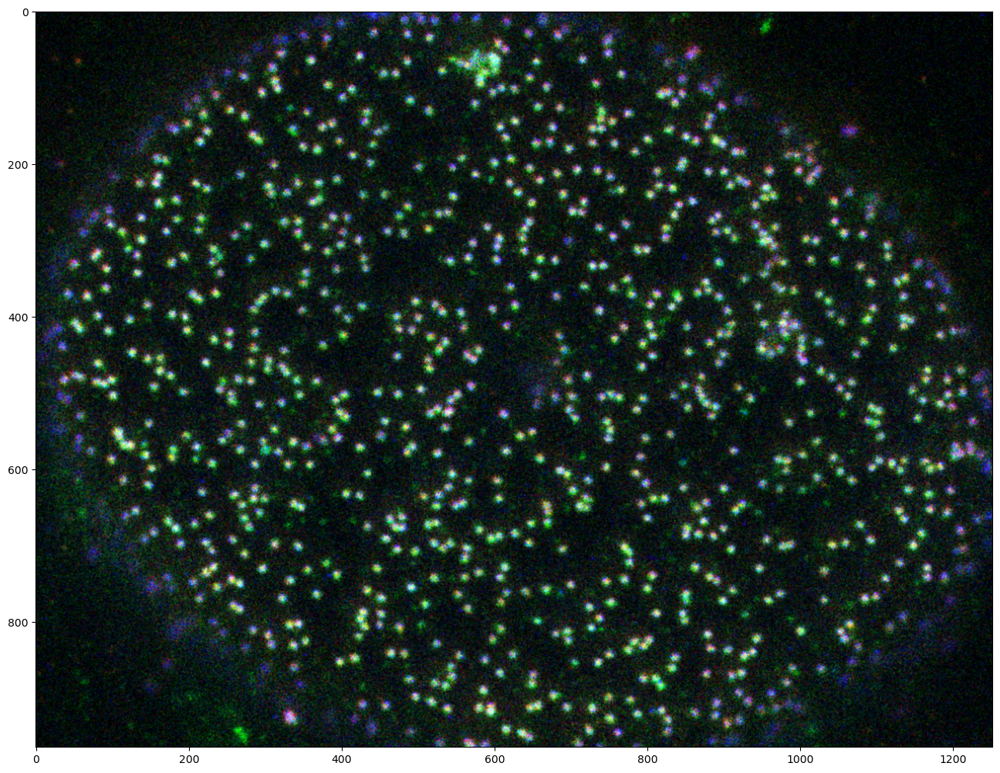

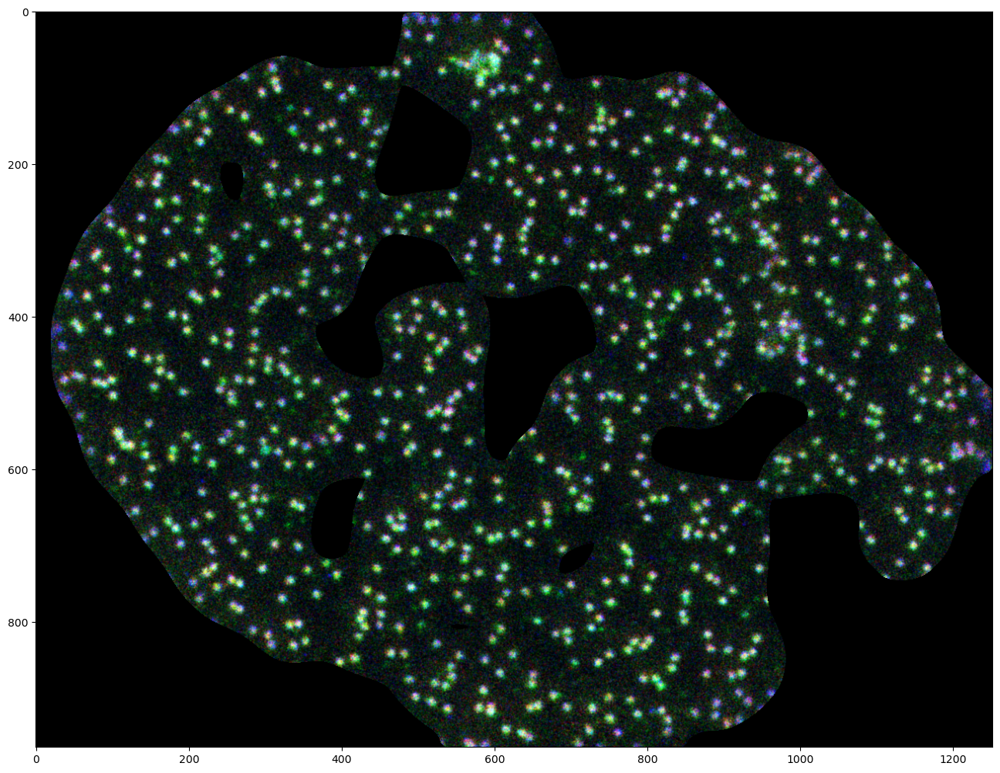

In [6]:
with tifffile.TiffFile(mABpath) as tif:
    mABraw = tif.pages[0].asarray()  # image as numpy array
    pxs_nm = 1e9/tif.pages[0].tags['XResolution'].value[0]  # pixel size in nm
    print('px size= ',pxs_nm)

with tifffile.TiffFile(POMpath) as tif:
    POMraw = tif.pages[0].asarray()  # image as numpy array
    #print(POMraw.shape)

with tifffile.TiffFile(NupXpath) as tif:
    NupXraw = tif.pages[0].asarray()  # image as numpy array
    #print(NupXraw.shape)

######################################################################################################################
## Pre-process images 

mAB = process(mABraw, gf_nm, pxs_nm)   
POM = process(POMraw, gf_nm, pxs_nm)
NupX = process(NupXraw, gf_nm, pxs_nm)  

B = np.zeros(POM.shape)
RGB0 = np.dstack((mAB,POM,NupX))    


## Get binary mask
mask = nucleus_focus_mask(POM, gaussstd_nm=500, pxs_nm=15, num_di=12, num_er=5)  


POMimg = POM*mask
mABimg = mAB*mask
NupXimg = NupX*mask

RGB1 = np.dstack((mABimg,POMimg,NupXimg))


fig,ax0 = plt.subplots(figsize=(16,16))
ax0.imshow(RGB0)

fig,ax1 = plt.subplots(figsize=(16,16))
ax1.imshow(RGB1)

    

---

## Detect peaks <a class="anchor" id="detect"></a>


(724, 2)
(741, 2)


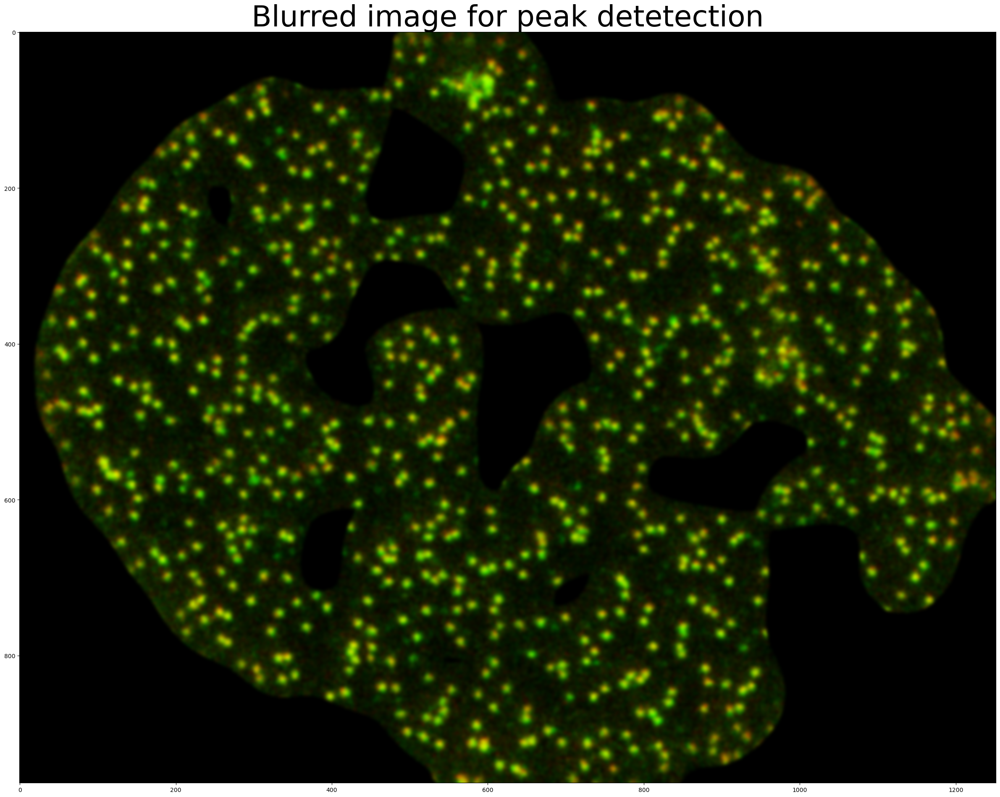

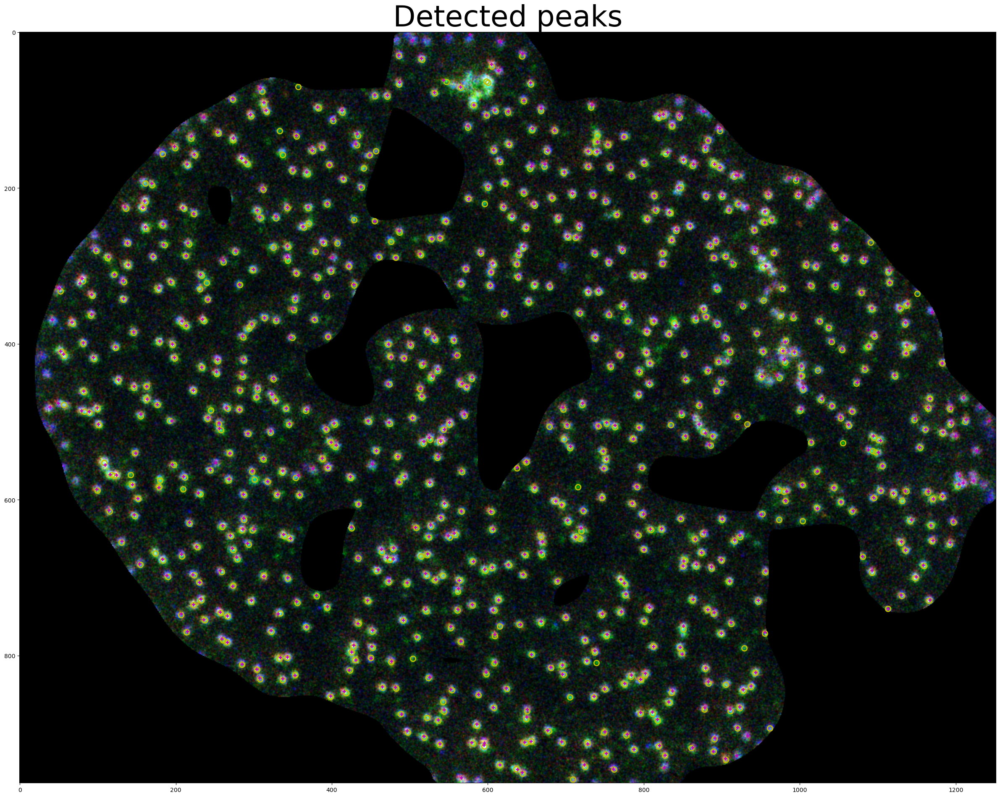

In [5]:
## Determine thresholds with otsu method
ThPOM = threshold_otsu(POMimg)+np.std(POMimg)  
ThmAB = threshold_otsu(mABimg)#+0.5*np.std(mABimg)

## Apply Gaussian filter to POM and mAB images
POMfilt = ndimage.gaussian_filter(POMimg,sm_size_nm/pxs_nm)
mABfilt = ndimage.gaussian_filter(mABimg,sm_size_nm/pxs_nm)

RGB2 = np.dstack((mABfilt,POMfilt,B))
fig, ax2 = plt.subplots(figsize=(30,30))
ax2.set_title('Blurred image for peak detetection', fontsize=50)
plt.imshow(RGB2)

## Detect POM and mAB peaks
POMpeaks = detect_pores(POMfilt, threshold=ThPOM, fwhm=120/pxs_nm)
mABpeaks = detect_pores(mABfilt, ThmAB, fwhm=90/pxs_nm)
#print(POMpeaks)

fig, ax3 = plt.subplots(figsize=(30,30))
plt.imshow(RGB1)
ax3.scatter(POMpeaks[:,0], POMpeaks[:,1], s=80,c='#FF000000',marker='o',edgecolors='y',linewidths=2)
ax3.scatter(mABpeaks[:,0], mABpeaks[:,1], s=30,c='m', marker='+',linewidths=2)
ax3.set_title('Detected peaks', fontsize=50)

print(mABpeaks.shape)
print(POMpeaks.shape)


In [24]:
print(ThPOM)
print(ThmAB)

0.4543546377762303
0.2391287762020622


---

## Sort pores by defining classes <a class="anchor" id="sorting"></a>


The idea is to create principal classes that refer to the image name (format: yymmdd_x (_x is not necessary)). The principal classes will contain subclasses that correspond to individual pore. Functions will be applied on these individual pores. 

In [ ]:
# Define the principal class
class Base_Class:      

    mAB_img = None # Corresponds to the channel mAB414 
    POM_img = None #Corresponds to the channel POM121
    NupX_img = None #Corresponds to the channel NupX --> the Nup of the third channel can change depending on the image

	ROI_list = np.array([])
	nuclei_count = 0
	props = {}
	intensity_list_DA_img = 0
    
    def __init__(self, LImage): #Initialisation of the principal class with the paths to access the different channels 
        #This function needs to include the Launcher_fro_serial_NupX_analysis

        self.TIFmage = LImage                     #Fichier LifImage
        self.DAPI_img = LImage.get_frame(c=0)    #Channel 0 : DAPI
        self.DD_img = LImage.get_frame(c=1)	     #Channel 1 : Donneur Ex / Donneur Em
        self.DA_img = LImage.get_frame(c=2)      #Channel 2 : Donneur Ex / Accepteur Em
        self.AA_img = LImage.get_frame(c=3)      #Channel 3 : Accepteur Ex / Accepteur EM

---

## Sort pores <a class="anchor" id="sorting"></a>

In [25]:
## NPCs = all mAB peaks
# Extract the date of the experiment 
date_exp=imgname.split('_')[0]
print(date_exp)

# create an Empty DataFrame object
df = pd.DataFrame()
 
# append columns to an empty DataFrame
df['Date'] = [date_exp for i in range (len(mABpeaks))]
df['NupX'] = [NupX_name for i in range(len(mABpeaks))]
df['Pore_Status'] = ['NPC' for i in range(len(mABpeaks))]
df['x_coordinate'] = mABpeaks[:,0]
df['y_coordinate'] = mABpeaks[:,1]
df['mAB414_POM121_distance']=([np.nan for i in range (len(mABpeaks))])
 
df


yymmdd


NameError: name 'NupX_name' is not defined

In [26]:
## PIs: they should be at least 'min_peak_dist' away from mAB peak

dist = min_peak_dist/pxs_nm
#PI = 0
PI_coord = np.array([])

#npc=np.array([df['x_coordinate'],df['y_coordinate']])
#print(npc)

mAB_POM_dist = []
#fig, ax = plt.subplots(figsize=(30,30))
#plt.imshow(RGB2)
#ax.scatter(mABpeaks[:,0], mABpeaks[:,1], s=30,c='m', marker='+',linewidths=2)
pore_status = []

for i in range (0,len(POMpeaks)):
    if shorter_dist(POMpeaks[[i]],mABpeaks)>=dist:
        mAB_POM_dist.append(shorter_dist(POMpeaks[[i]],mABpeaks)*pxs_nm)
        #PI=PI+1
        PI_coord = np.append(PI_coord,np.array(POMpeaks[[i]])) # On récupère les coordonnées POM121 de chaque pore immature 
        PI_coord = np.reshape(PI_coord,(-1,2))
        pore_status.append('PI')
        #ax.scatter(POMpeaks[i,0], POMpeaks[i,1], s=80,c='#FF000000',marker='o',edgecolors='y',linewidths=2)
        
#print(PI_coord)
#print(mAB_POM_dist)
#print(PI)
#print(type(pore_status))
df2 = pd.DataFrame()
df2['Date'] = [date_exp for i in range (len(PI_coord))]
df2['NupX'] = [NupX_name for i in range(len(PI_coord))]
df2['Pore_Status'] = ['PI' for i in range (len(PI_coord))]
df2['x_coordinate'] = PI_coord[:,0]
df2['y_coordinate'] = PI_coord[:,1]

df2['mAB414_POM121_distance']=[mAB_POM_dist[i] for i in range (len(PI_coord))]
print(df2)

df_final=pd.concat([df,df2],ignore_index=True)
print(df_final)
df_final.to_csv(outputpath+'/pores.csv')

NameError: name 'NupX_name' is not defined

In [ ]:
fig, ax4 = plt.subplots(figsize=(30,30))
plt.imshow(RGB1)
ax4.scatter(PI_coord[:,0], PI_coord[:,1], s=80,c='#FF000000',marker='o',edgecolors='y',linewidths=2)
ax4.scatter(mABpeaks[:,0], mABpeaks[:,1], s=30,c='m', marker='+',linewidths=2)

fig.savefig(outputpath+f'/{imgname}_pores.jpg')


In [ ]:
# To be done: append an existing .csv file each time we run the code 

---

## Analyze pore intermediates <a class="anchor" id="analysis"></a>


Here the goal is to extract fluorescence intensity profiles from every NPC and PI position, in 2 (mAb414 + POM121) or 3 channels (+ additional Nup if available).

1. for each image, 
    - load the 2 or 3 channels, 
    - build RGB and show image.
    - Load pore positions.
2. for each NPC position
    - plot NPC position on the RGB image
    - measure rotationally averaged profile in 2 or 3 channels
    - represent them (superimposed)
    - represent the cropped RGB image around the analyzed pore (300x300nm)
    - save: make a new data frame which is the copy of the previous one + profiles.
3. do the same for PIs
4. Once all this works
    - fit the profiles
    - extract parameters
    - calculate diameter (when 2 or more gaussians)
    - save results in the previous dataframe
    
---

### Linear interpolation along the line



In [27]:
## set parameters for line profiles

pores = pd.read_csv(outputpath+'/pores.csv', sep=',')

angle_bin = 20
length = round(300/pxs_nm)
bins = 51

x = np.linspace(-150,150,bins)

PIs = pores[pores['Pore_Status']=='PI']

date=[]; nupX=[]; status=[]; x_coord=[]; y_coord=[]  #metadata


POM_profiles=[];mAB_profiles=[];NupX_profiles=[]   #intensity profiles for each channel
function =[]   #function used for fitting
tolerance=[]   # goodness parameter used for the iterative fit function

N1=[];N2=[];N3=[]  # number of iterations reached 1=POM121, 2=mAb414, 3=NupX
A1=[];X1=[];S1=[]  # A= amplitude, X=peak position, S=sigma
A2=[];X2=[];S2=[]
A3=[];X3=[];S3=[]
res1=[];res2=[];res3=[]  # residuals of the fits

for i in range (0,len(PIs)):
    x0 = PIs['x_coordinate'].iloc[i]
    y0 = PIs['y_coordinate'].iloc[i]
    l=round(length/2)+1
    roi = RGB1[round(y0-2*l):round(y0+2*l), round(x0-2*l):round(x0+2*l)]
   
    #print(i)
    POM_profile = generate_rotational_line_profile(POM, (x0, y0), angle_bin, length, bins)
    mAB_profile = generate_rotational_line_profile(mAB, (x0, y0), angle_bin, length, bins)
    NupX_profile = generate_rotational_line_profile(NupX, (x0, y0), angle_bin, length, bins)
    
    if np.isnan(POM_profile).any():
        POM_profiles.append([np.nan])
        mAB_profiles.append([np.nan])
        NupX_profiles.append([np.nan])
        date.append(PIs['Date'].iloc[i])
        nupX.append(PIs['NupX'].iloc[i])
        status.append(PIs['Pore_Status'].iloc[i])
        x_coord.append(x0)
        y_coord.append(y0)                     

        function.append([np.nan])            
        tolerance.append([np.nan])

        N1.append([np.nan])
        N2.append([np.nan])
        N3.append([np.nan])

        A1.append([np.nan])
        X1.append([np.nan])
        S1.append([np.nan])

        A3.append([np.nan])
        X3.append([np.nan])
        S3.append([np.nan])

        A2.append([np.nan])
        X2.append([np.nan])
        S2.append([np.nan])

        res1.append([np.nan])
        res2.append([np.nan])
        res3.append([np.nan])
        continue
    
    else:
        
        
        for tol in [0.05,0.1,0.2]:
            
            for f in[gaussian,lorentzian]:
                n1, popt1, pcov1, r_sq1, residuals1 = iterative_fit(f,x,POM_profile,nb_iterations=2,tol=tol,sigma=50)
                n2, popt2, pcov2, r_sq2, residuals2 = iterative_fit(f,x,mAB_profile,nb_iterations=1,tol=tol,sigma=50)
                n3, popt3, pcov3, r_sq3, residuals3 = iterative_fit(f,x,NupX_profile,nb_iterations=5,tol=tol,sigma=50)
              
                a1=[];x1=[];s1=[]
                a2=[];x2=[];s2=[]
                a3=[];x3=[];s3=[]
              
                for j in range(n1):
                    a1.append(round(popt1[3*j],2))
                    x1.append(round(popt1[3*j+1],2))
                    s1.append(round(popt1[3*j+2],2))
                
                for j in range(n2):
                    a2.append(round(popt2[3*j],2))
                    x2.append(round(popt2[3*j+1],2))
                    s2.append(round(popt2[3*j+2],2))
                
                for j in range(n3):
                    a3.append(round(popt3[3*j],2))
                    x3.append(round(popt3[3*j+1],2))
                    s3.append(round(popt3[3*j+2],2))
                
                fig,(ax0,ax1) = plt.subplots(nrows=1, ncols=2,figsize=(8,4))
                # Plot line profiles for each channel
                ax0.imshow(roi)
                ax1.plot(x,POM_profile,'g')
                ax1.plot(x,mAB_profile, 'r')
                ax1.plot(x,NupX_profile, 'b')
                #fig.set_title(f'PI, Point: {round(x0,1),round(y0,1)}, NupX: {NupX_name}, date:{date_exp}', fontsize=16)
                ax1.set_ylim([0,1])
                ax1.set_xlabel('Radial distance (nm)', fontsize=14)
                ax1.set_ylabel('Fluorescence intensity (AU)', fontsize=14)

                ax1.annotate('POM121\nn='+str(n1)+'\npeakss: '+str(x1), 
                            xy=(-150,0.95), xycoords='data', 
                            horizontalalignment='left', verticalalignment='top',fontsize=12)

                ax1.annotate('mAb414\nn='+str(n2)+'\npeaks: '+str(x2), 
                            xy=(-50,0.95), xycoords='data', 
                            horizontalalignment='left', verticalalignment='top',fontsize=12)

                ax1.annotate('NupX\nn='+str(n3)+'\npeaks: '+str(x3), 
                            xy=(75,0.95), xycoords='data', 
                            horizontalalignment='left', verticalalignment='top',fontsize=12)

                



                #xfit = np.linspace(-150,150,500)


                # Plot profile fits for each channel
                ax1.plot(x,f(x,*popt1),'g--')
                ax1.plot(x,f(x,*popt2),'r--')
                ax1.plot(x,f(x,*popt3),'b--')
                for j in range(n3):
                    ax1.fill_between(x,f(x,popt3[3*j],popt3[3*j+1], popt3[3*j+2],popt3[-1]),color='b',alpha=0.1)


                fig.savefig(outputpath+f'/_tol{tol}_{f}_{i}_PI_graph.jpg')

                plt.close()
            
            POM_profiles.append(np.array(POM_profile))
            mAB_profiles.append(np.array(mAB_profile))
            NupX_profiles.append(np.array(NupX_profile))
        
            date.append(PIs['Date'].iloc[i])
            nupX.append(PIs['NupX'].iloc[i])
            status.append(PIs['Pore_Status'].iloc[i])
            x_coord.append(x0)
            y_coord.append(y0)                     
                                    
            function.append(f)            
            tolerance.append(tol)

            N1.append(n1)
            N2.append(n2)
            N3.append(n3)

            A1.append(a1)
            X1.append(x1)
            S1.append(s1)

            A3.append(a3)
            X3.append(x3)
            S3.append(s3)

            A2.append(a3)
            X2.append(x3)
            S2.append(s3)

            res1.append(round(r_sq1,3))
            res2.append(round(r_sq2,3))
            res3.append(round(r_sq3,3))

print(len(POM_profiles),len(PIs))


   



FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users/Emilie/Documents/Data/STED/Test_file/output_data/pores.csv'

In [ ]:
df3=pd.DataFrame()

df3['Date'] = date[:]
df3['NupX'] = nupX[:]
df3['Pore_Status'] = status[:]
df3['x_coordinate'] = x_coord[:]
df3['y_coordinate'] = y_coord[:]

df3['POM_profile'] = POM_profiles[:]
df3['mAB_profile'] = mAB_profiles[:]
df3['NupX_profile'] = NupX_profiles[:]

df3['POM nb iterations'] = N1[:]
df3['POM peaks'] = X1[:]
df3['POM sigmas'] = S1[:]

df3['mAB nb iterations'] = N2[:]
df3['mAB peaks'] = X2[:]
df3['mAB sigmas'] = S2[:]

df3['NupX nb iterations'] = N3[:]
df3['NupX peaks'] = X3[:]
df3['NupX sigmas'] = S3[:]
    
#d=pd.DataFrame(columns=[['Date'],['Status'],['NupX'],['x0'],['y0'],['POM_profile'],['mAB_profile'],['NupX_profile']],data= PI_profiles)
#d.to_csv(outputpath+'PI_profiles.csv')

df3.to_csv(outputpath+'/pore_analysis.csv')

    




NPCs = pores[pores['Pore_Status']=='NPC']

for i in range (0,len(NPCs)):
    #print(i)
    x0 = NPCs['x_coordinate'].iloc[i]
    y0 = NPCs['y_coordinate'].iloc[i]
    
    POM_profile = generate_rotational_line_profile(POM, (x0, y0), angle_bin, length, bins)
    mAB_profile = generate_rotational_line_profile(mAB, (x0, y0), angle_bin, length, bins)
    NupX_profile = generate_rotational_line_profile(NupX, (x0, y0), angle_bin, length, bins)

    #ax5.plot(x,mAB_profile,'r')
    #ax5.plot(x,POM_profile,'g')
    #ax5.plot(x,NupX_profile,'b')
    #ax5.set_title('NPCs')

#### Conclusion on this: 

It seems to work OK. Let's start with this.

Next step is to fit the profiles with 1, 2, 3 or 4 gaussians, extract parameters, calculate diameters...





---

## Fit intensity profiles

for this we will do iterative fits, using the functions defined in 
> iterative_functions.py

for NupX, we may expect up to 5 peaks => nb_iterations = 5

- xdata = x
- ydata = individual pore profiles (ideally we want to do that for mAB, POM and NupX)



